In [1]:
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import scipy
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import colors

#Read config file
import configparser as config
config = config.ConfigParser()
config.read('./config.ini')
data_path=config['PATHS']["wd"]

sc.settings.verbosity = 0         
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=100)
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB

-----
anndata     0.7.4
scanpy      1.5.1
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
anyio               NA
attr                20.1.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.19.1
certifi             2022.06.15
cffi                1.14.1
chardet             3.0.4
cloudpickle         1.2.2
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dask                2.10.1
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
google              NA
h5py                2.9.0
idna                2.10
igraph              0.7.1
importlib_metadata  1.7.0
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              0.16.0
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
leide

In [2]:
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

dirname: Trying to get version of anndata2ri from dirname /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages
dirname: Failed; Does not match re.compile('anndata2ri-([\\d.]+?)(?:\\.dev(\\d+))?(?:[_+-]([0-9a-zA-Z.]+))?$')
git: Trying to get version from git in directory /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages
git: Failed; directory is not managed by git
metadata: Trying to get version for anndata2ri in dir /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages
metadata: Succeeded


In [3]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [4]:
%%R
library(scran)        #preprocessing
library(RColorBrewer) #visualization
library(clusterExperiment) #visualization
library(ggplot2)
library(plyr)
library(MAST)         #differential expression analysis


Error in library(scran) : there is no package called ‘scran’


# Read Data

In [5]:
results_file = data_path+'GSE130888_RAW/SPD/results_2.h5ad'  

filenames = [data_path+"GSE130888_RAW/SPD/GSM3755687/",
             data_path+"GSE130888_RAW/SPD/GSM3755688/",
             data_path+"GSE130888_RAW/SPD/GSM3755689/",
             data_path+"GSE130888_RAW/SPD/GSM3755690/",
             data_path+"GSE130888_RAW/SPD/GSM3755691/",
             data_path+"GSE130888_RAW/SPD/GSM3755692/"]
sample_string = ["GSM3755687", "GSM3755688", "GSM3755689","GSM3755690", "GSM3755691", "GSM3755692"]
sample_id = ["0","1","2","3","4","5"]

In [6]:
#read first data
adata = sc.read_10x_mtx(filenames[0], var_names="gene_symbols", cache=True)
adata.obs["sample"] = [sample_string[0]]*adata.n_obs
adata.obs["batch"] = ["batch_0"]*adata.n_obs
adata.var_names_make_unique() 
adata

# read additional data
for index,filepath in enumerate(filenames[1:], start=1):
    print(index, filepath)
    adata_tmp = sc.read_10x_mtx(filepath, var_names="gene_symbols", cache=True)
    adata_tmp.obs["sample"] = [sample_string[index]]*adata_tmp.n_obs
    adata_tmp.obs["sample_id"] = [str(index)]*adata_tmp.n_obs
    adata_tmp.obs["batch"] = ["batch_"+str(index)]*adata_tmp.n_obs
    adata_tmp.var_names_make_unique() 
    
    #concatenate to main data
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    adata.obs.drop(columns=['sample_id'], inplace=True)

1 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/SPD/GSM3755688/
2 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/SPD/GSM3755689/
3 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/SPD/GSM3755690/
4 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/SPD/GSM3755691/
5 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/SPD/GSM3755692/


# Preprocessing:

## Quality controll:  
take thesholds and filter options from Si *et al.* (2019)

In [7]:
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
mito_genes = adata.var_names.str.startswith('MT-') # get mt genes
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_genes'] = (adata.X > 0).sum(1).A1

In [8]:
sc.pp.filter_cells(adata, min_genes=200, inplace=True) #remove cell if less then 200 genes in cell expressed
sc.pp.filter_genes(adata, min_cells=3, inplace=True)   #remove gene if less then 3 cells express the gene

#filter out cells with more then 30% mt genes:
print(adata[adata.obs.percent_mito >= 0.3, :].shape[0], " cells were removed with more then 30% mt genes")
adata = adata[adata.obs.percent_mito < 0.3, :]

64  cells were removed with more then 30% mt genes


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/anndata/_core/anndata.py:1237: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'batch' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/mnt/dzl_bioinf/exec/min

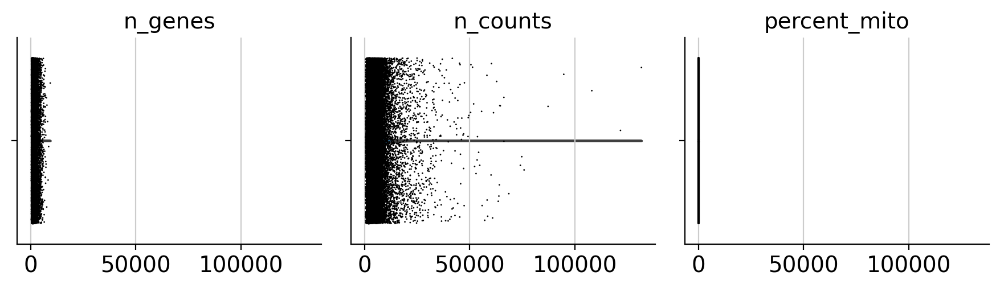

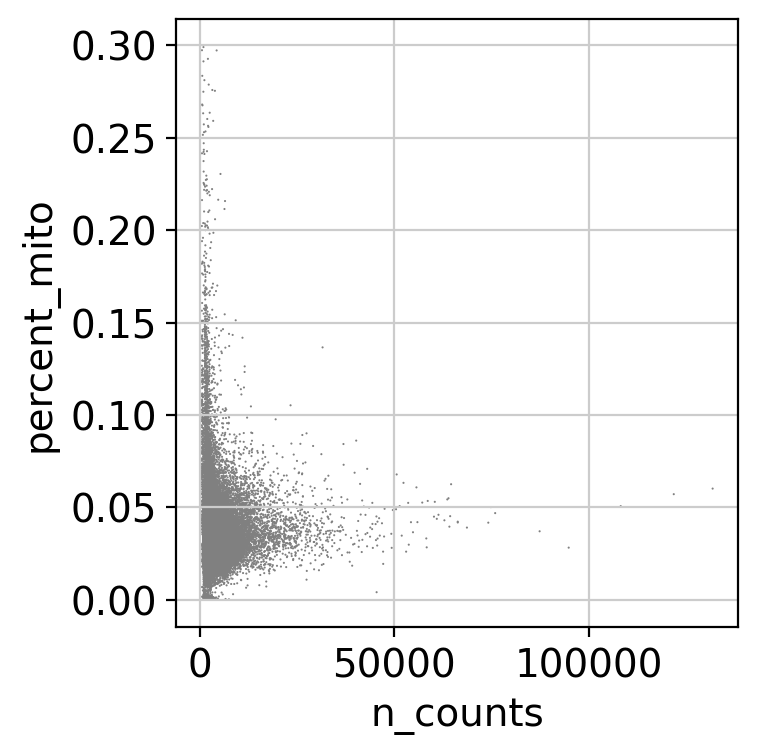

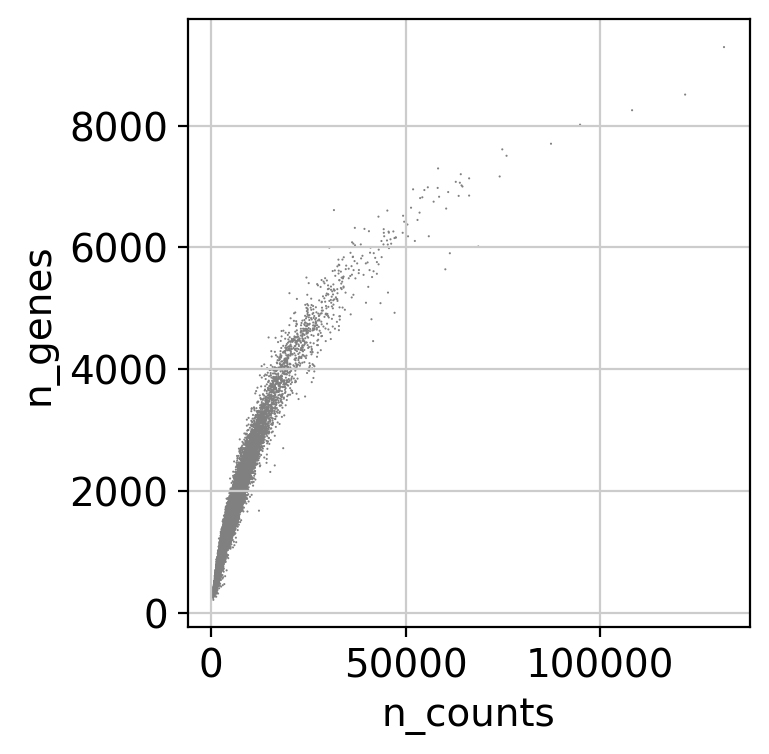

In [9]:
#after filtering:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],jitter=0.4, multi_panel=True)#, groupby="sample")
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

## Normalization and Log
#### CPM 

In [10]:
adata_pp = adata.copy() 
sc.pp.normalize_total(adata_pp, target_sum=1e6, exclude_highly_expressed=True)    # CPM
sc.pp.log1p(adata_pp)                                                             # log
#adata.raw = adata  # save current data (normlaized and log-transformed) as raw

#### Scran

In [11]:
#Perform a clustering for scran normalization in clusters
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='batch', resolution=0.5)

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc

In [12]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['batch']
data_mat = adata.X.T

In [13]:
%%R
R.version
.libPaths( c( "/mnt/dzl_bioinf/exec/R_libs/3.6.0"  , .libPaths()[2] ) )

In [14]:
%%R -i data_mat -i input_groups -o size_factors
library(scran)
size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

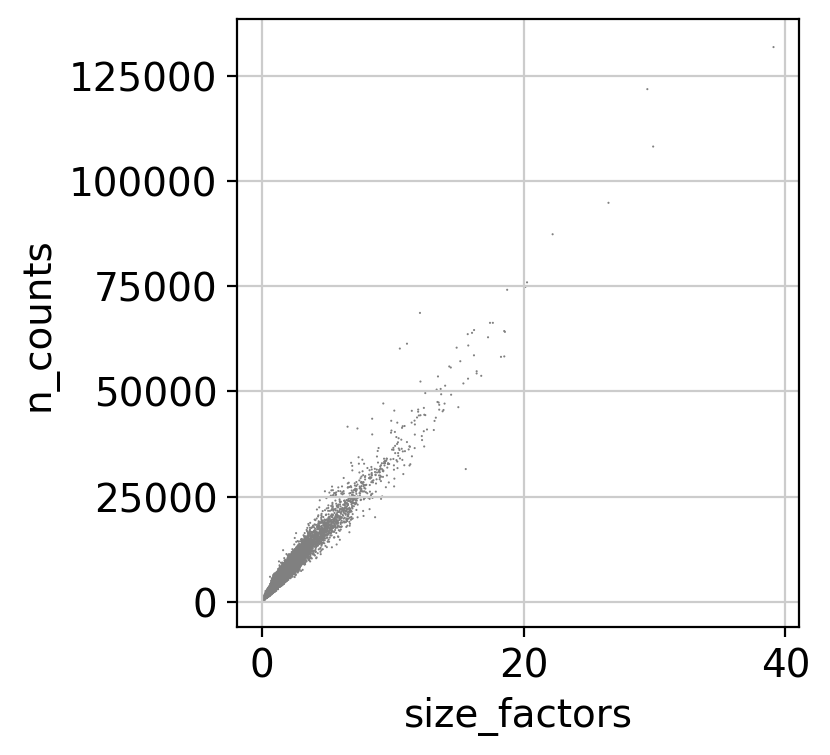

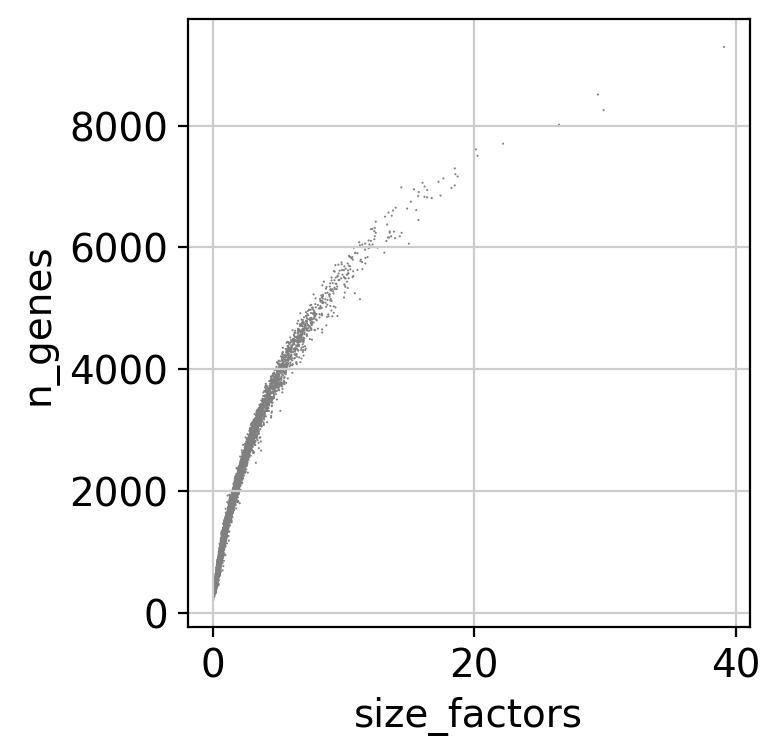

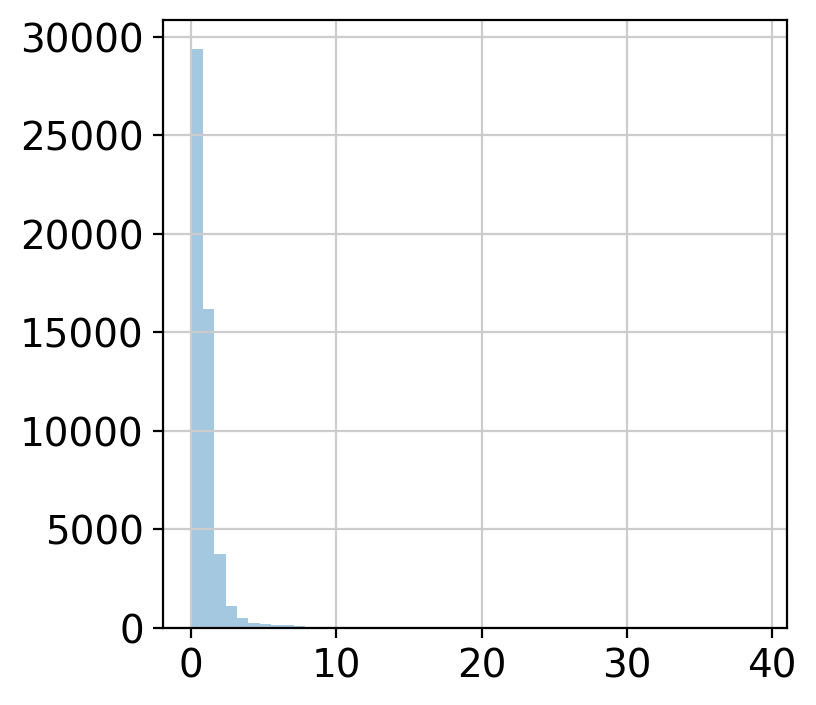

In [15]:
#Delete adata_pp
del adata_pp

# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors
sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')
sb.distplot(size_factors, bins=50, kde=False)
plt.show()

In [16]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
adata.X = scipy.sparse.csr_matrix(adata.X) #convert dense back to spares
sc.pp.log1p(adata)

adata.raw = adata #normalized and log-transformed with an offset of 1

## Batch correction

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


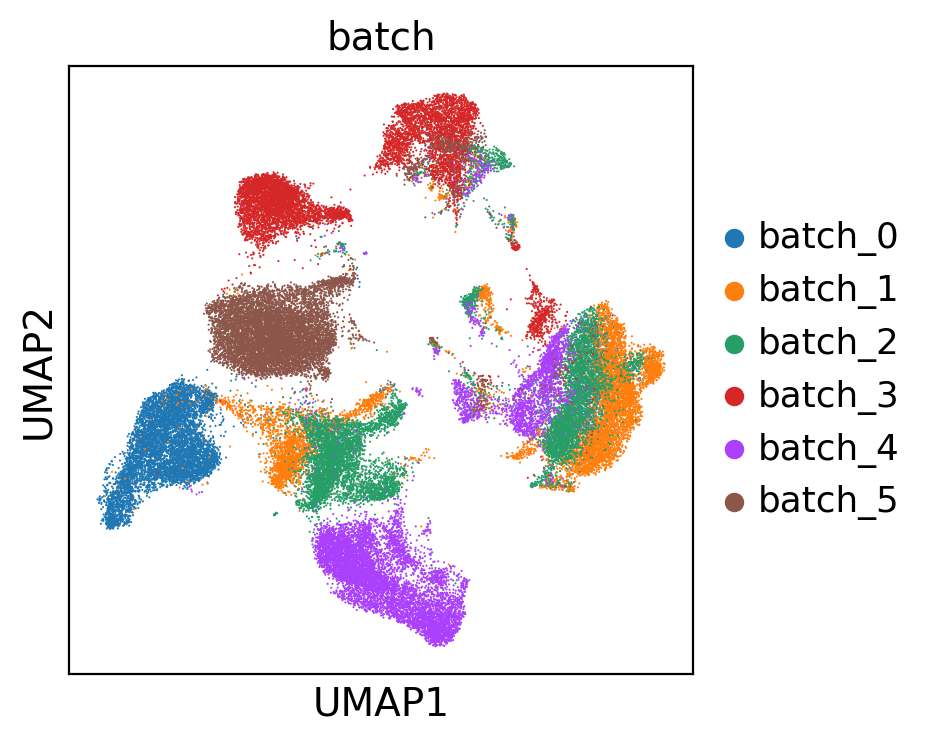

In [17]:
sc.pp.pca(adata, svd_solver='arpack')#, use_highly_variable=True)
sc.pp.neighbors(adata)#, n_neighbors=20, n_pcs=10)
sc.tl.umap(adata)
sc.pl.umap(adata, color='batch')#, use_raw=False)

In [18]:
#ComBat batch correction
sc.pp.combat(adata, key="batch") 

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in true_divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


## Feature selection - identify highly variable genes (HVGs)


 Number of highly variable genes: 4000


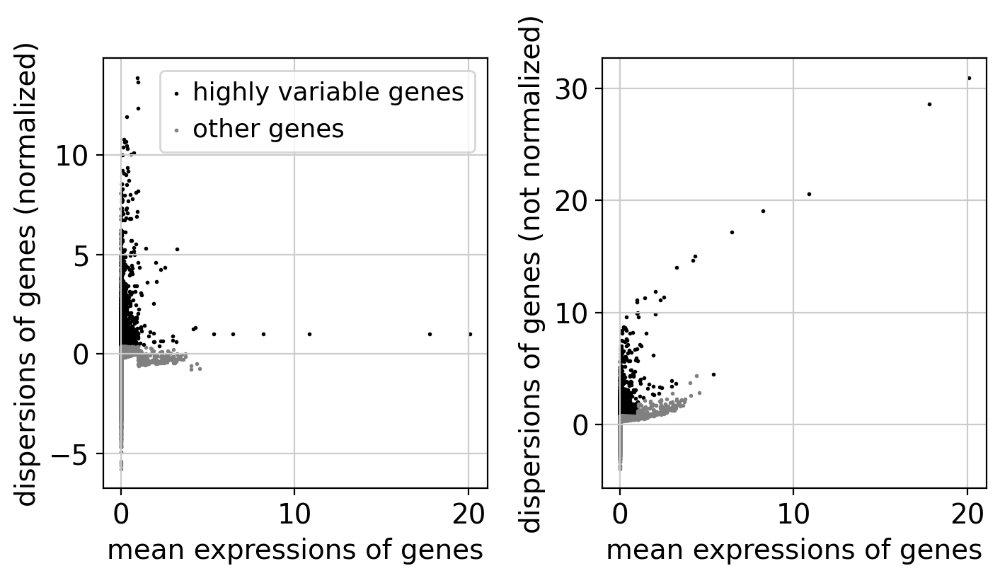

In [19]:
sc.pp.highly_variable_genes(adata, n_top_genes=4000)                        
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))
sc.pl.highly_variable_genes(adata)

## Visualization

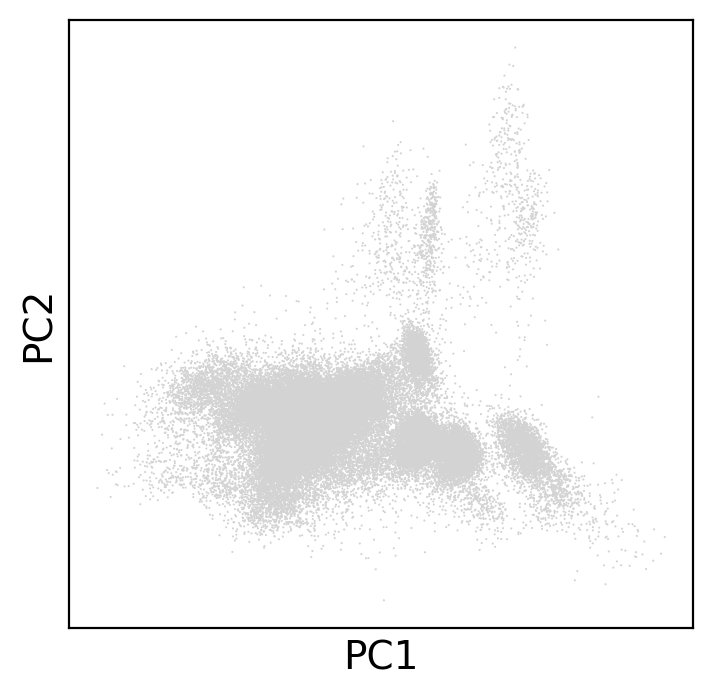

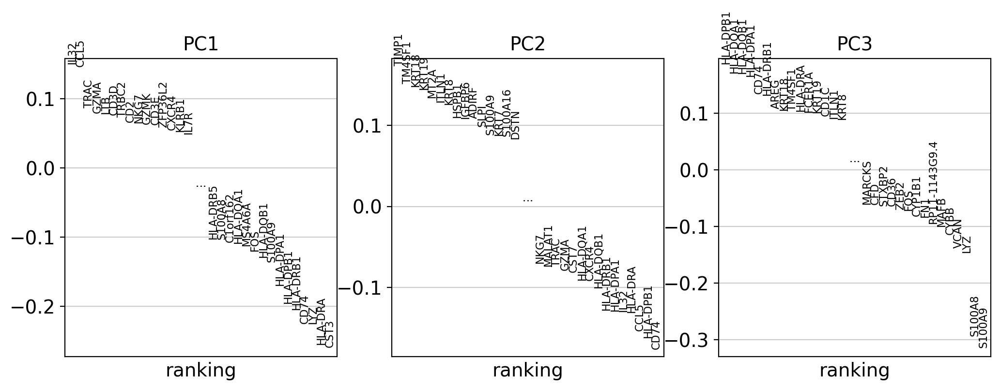

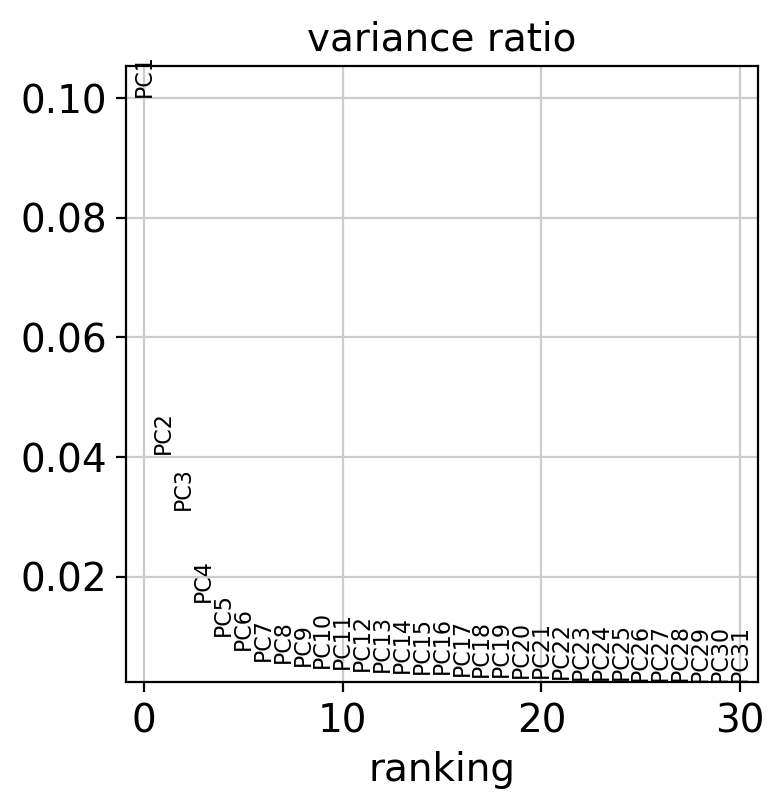

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../exec/miniconda/miniconda3/envs/scRNA_R3.6.1/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


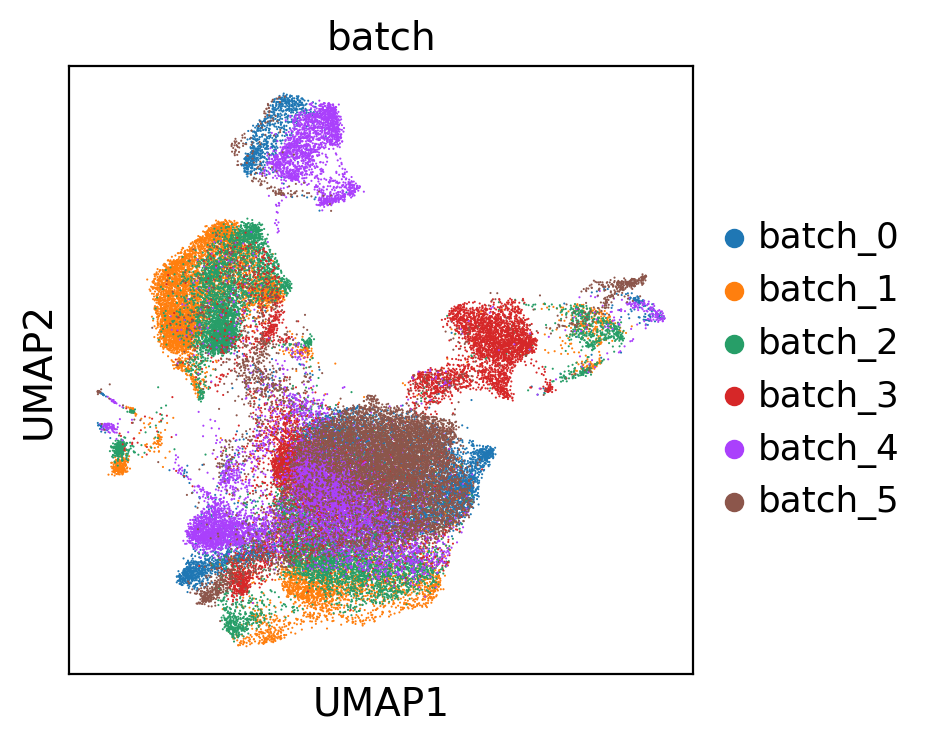

In [20]:
#reduce dimensions with PCA
sc.tl.pca(adata, n_comps= 50, svd_solver='arpack', use_highly_variable=True)
sc.pl.pca_overview(adata)
sc.pp.neighbors(adata, n_neighbors=20)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch'])

## Cluster analysis

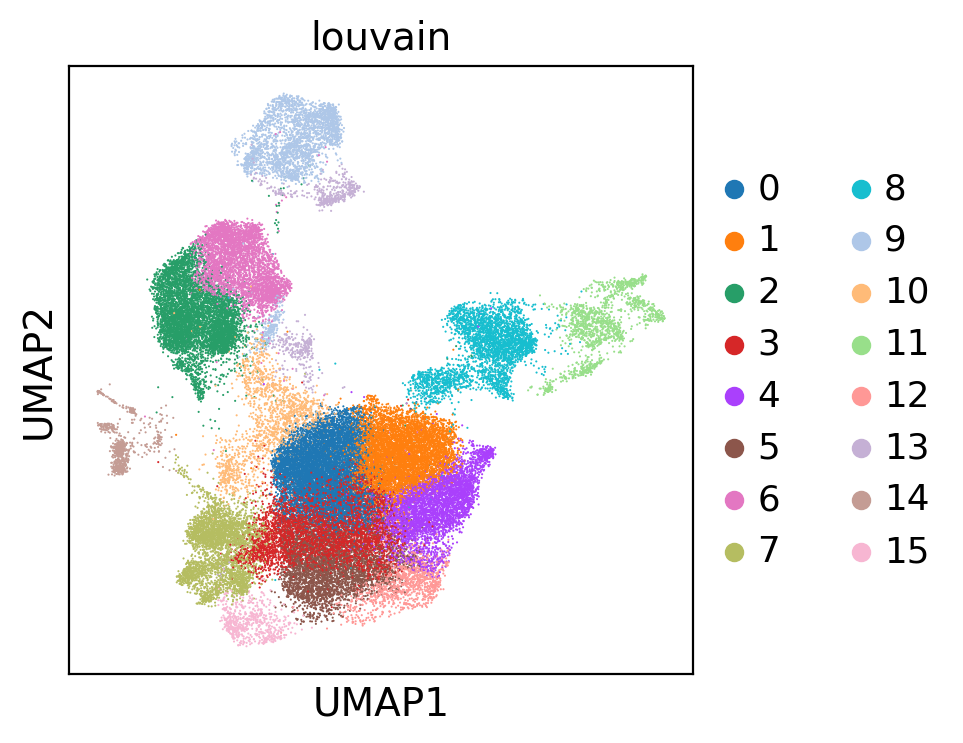

In [37]:
#clustering:
sc.tl.louvain(adata, resolution=1.1)
sc.pl.umap(adata, color=['louvain'])

### Cluster annotation
### Markergenes

**Wilcox rank-sum (Mann-Whitney-U)**

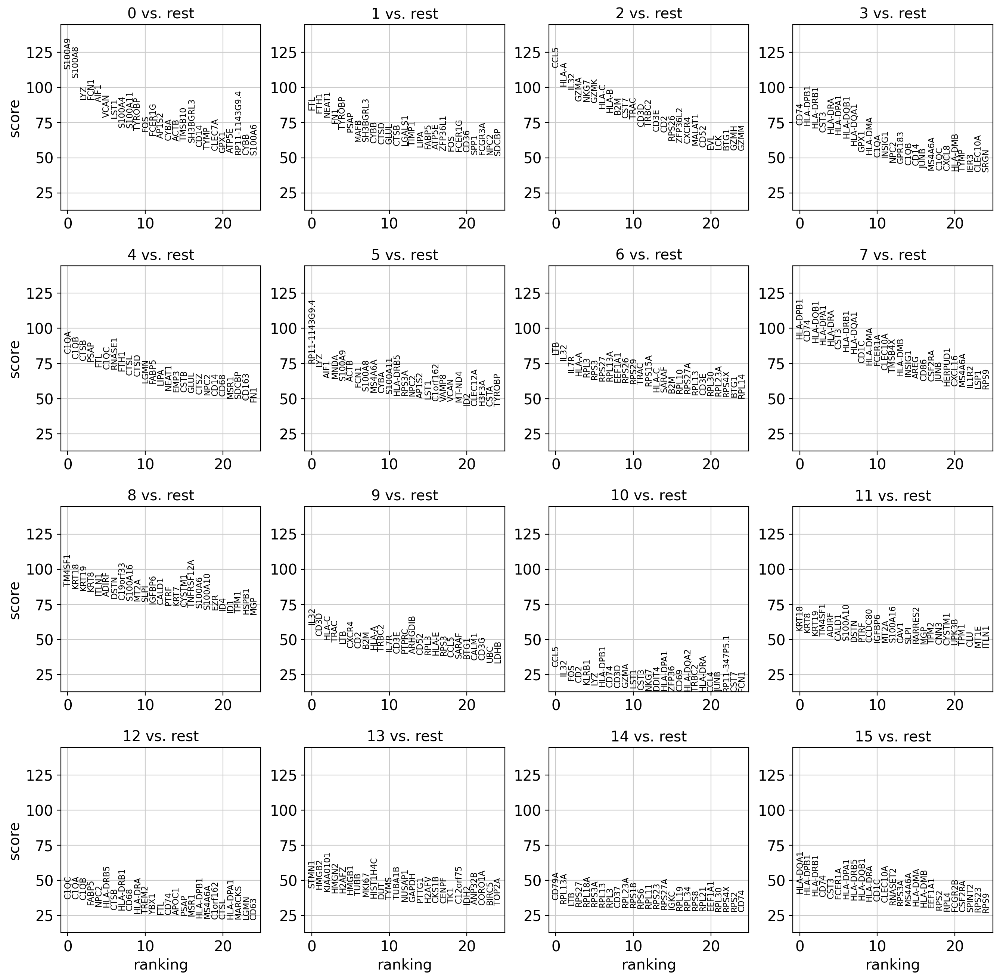

In [38]:
sc.tl.rank_genes_groups(adata, groupby='louvain', method='wilcoxon') 
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=True)

In [39]:
#show top 2 ranked genes per cluster
pd.set_option('display.max_columns', 35)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,S100A9,FTL,CCL5,CD74,C1QA,RP11-1143G9.4,LTB,HLA-DPB1,TM4SF1,IL32,CCL5,KRT18,C1QC,STMN1,CD79A,HLA-DQA1
1,S100A8,FTH1,HLA-A,HLA-DPB1,C1QB,LYZ,IL32,CD74,KRT18,CD3D,IL32,KRT8,C1QA,HMGB2,RPL13A,HLA-DPB1
2,LYZ,NEAT1,IL32,HLA-DRB1,CTSB,AIF1,IL7R,HLA-DQB1,KRT19,HLA-C,FOS,KRT19,C1QB,KIAA0101,LTB,HLA-DRB1
3,FCN1,FN1,GZMA,CST3,PSAP,MNDA,HLA-A,HLA-DPA1,KRT8,TRAC,CD2,TM4SF1,FABP5,HMGN2,RPS27,CD74
4,AIF1,TYROBP,NKG7,HLA-DRA,FTL,S100A9,RPL3,HLA-DRA,ITLN1,LTB,KLRB1,ADIRF,NPC2,H2AFZ,RPL18A,CST3
5,VCAN,PSAP,GZMK,HLA-DPA1,C1QC,ACTB,RPS3,CST3,ADIRF,CXCR4,LYZ,CALD1,HLA-DRB5,HMGB1,RPS3A,FCER1A
6,LST1,MAFB,HLA-C,HLA-DQB1,RNASE1,FCN1,RPS27,HLA-DRB1,DSTN,CD2,HLA-DPB1,S100A10,CTSB,TUBB,RPL13,HLA-DPA1
7,S100A4,SH3BGRL3,HLA-B,HLA-DQA1,FTH1,S100A8,RPL13A,HLA-DQA1,C19orf33,B2M,CD74,DSTN,HLA-DRB1,MKI67,RPL3,HLA-DRB5
8,S100A11,CYBB,B2M,GPX1,CTSL,MS4A6A,EEF1A1,CD1C,S100A16,HLA-A,CD3D,PTRF,CD68,HIST1H4C,CD37,HLA-DQB1
9,TYROBP,CTSD,CST7,HLA-DMA,CTSD,CYBA,RPS26,HLA-DMA,MT2A,TRBC2,GZMA,CCDC80,HLA-DRA,DUT,RPL23A,HLA-DRA


In [40]:
#list of markergenes 
marker_genes=["CD3D","CD3E","NKG7", # t
              "KRT5","UPK3B","PDPN", # mesothelia
              "CD14", "S100A8",      # mononucl
              "PDGFRB", "ACTA2",     # myrofibroblast
              "MMP2", "SFRP2",       # firbroblast
              "PECAM1", "VWF",       # endothelia
              "MS4A1"]               # B   
marker_genes_dict={"T-Cell":["CD3D","CD3E","NKG7"], # t
                  "Mesothelial":["KRT5","UPK3B","PDPN"], # mesothelia
                  "Mononuclear":["CD14", "S100A8"],      # mononucl
                  "Myofibroblast":["PDGFRB", "ACTA2"],     # myrofibroblast
                  "Fibroblast":["MMP2", "SFRP2"],       # firbroblast
                  "Endothelial":["PECAM1", "VWF"],       # endothelia
                  "B-Cell":["MS4A1"]}      # B  

### see which cluster has how many markers in ranked genes:

In [41]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

<AxesSubplot:>

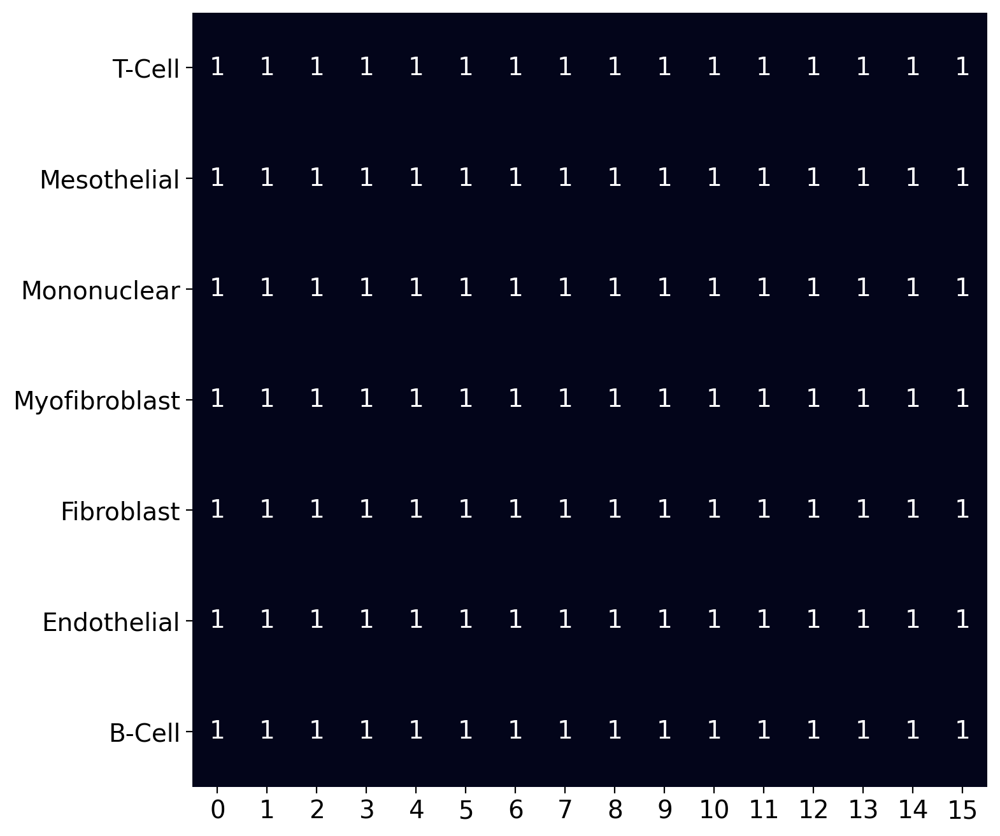

In [42]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes_dict, normalize='reference')
fig, ax = plt.subplots(figsize=(8,8))
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

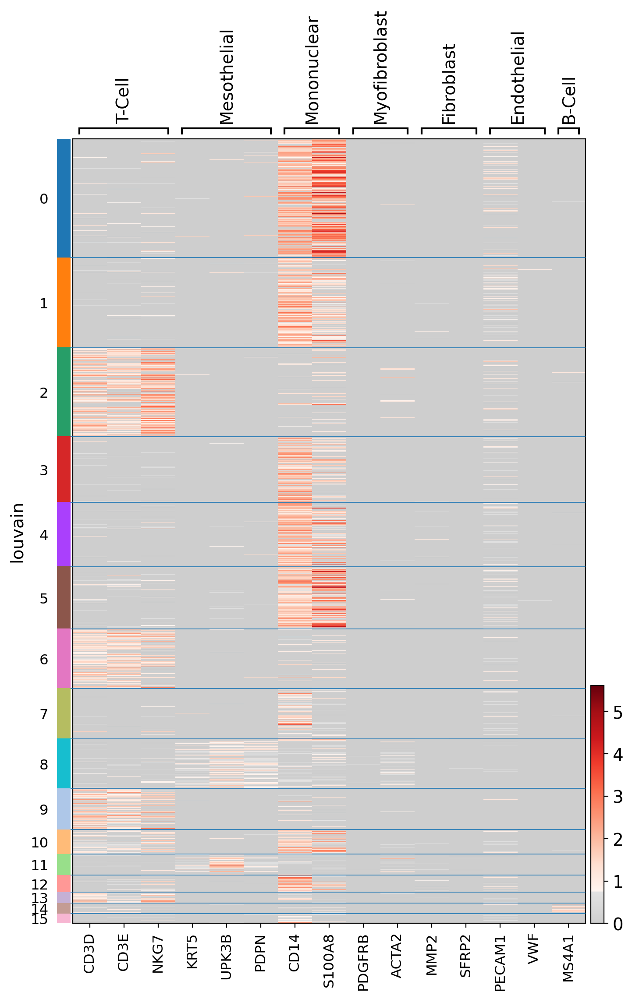

In [43]:
ax = sc.pl.heatmap(adata, marker_genes_dict, groupby='louvain', show_gene_labels=True, figsize =(8,12), cmap=mymap)

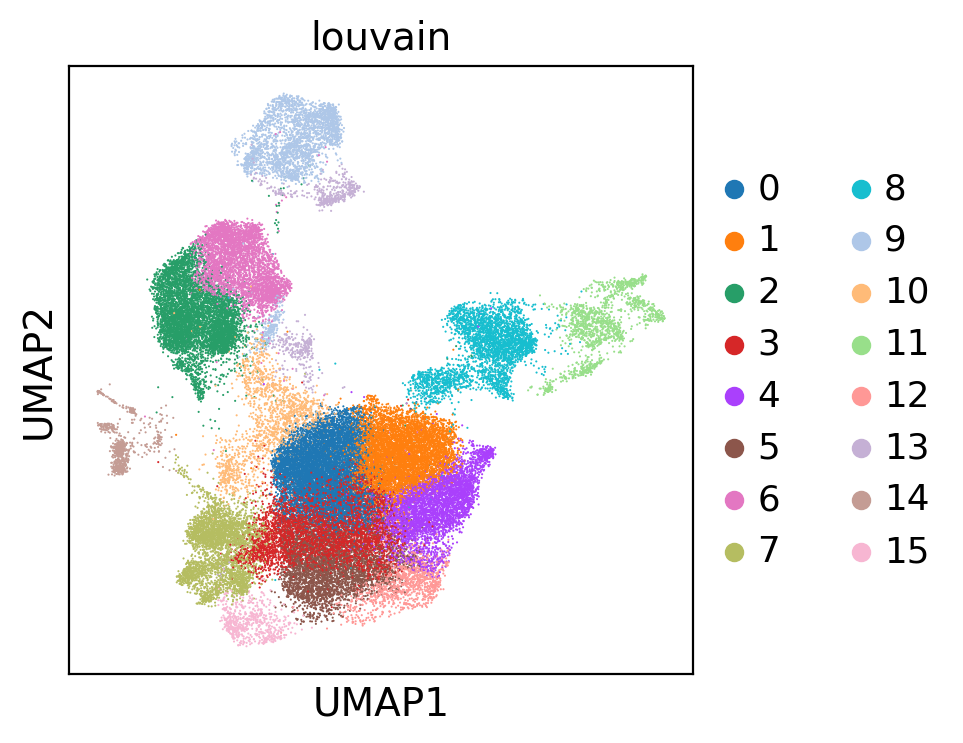

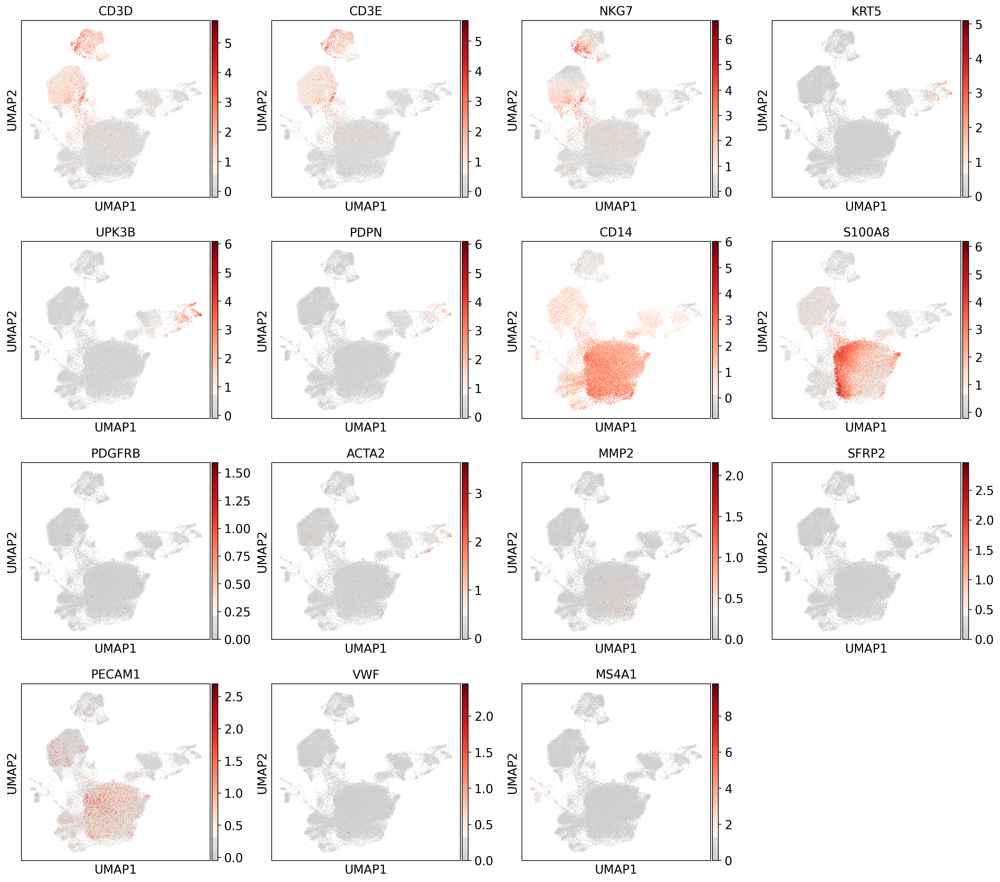

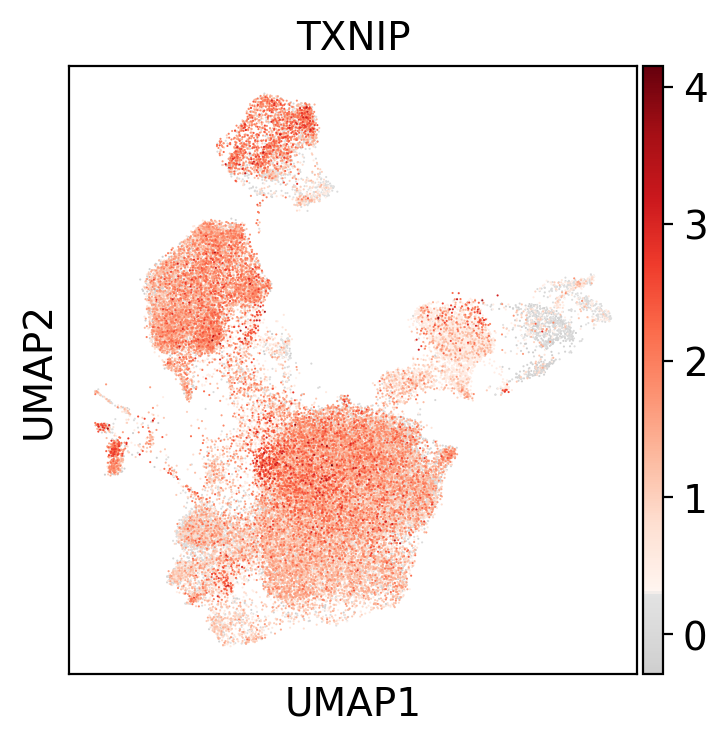

In [44]:
#visualize clusters:
sc.pl.umap(adata, color=['louvain'])

#color by marker
sc.pl.umap(adata, color=marker_genes, use_raw=False, color_map=mymap)
sc.pl.umap(adata, color=["TXNIP"], use_raw=False, color_map=mymap, title=["TXNIP"])

### rename clusters with cell identities

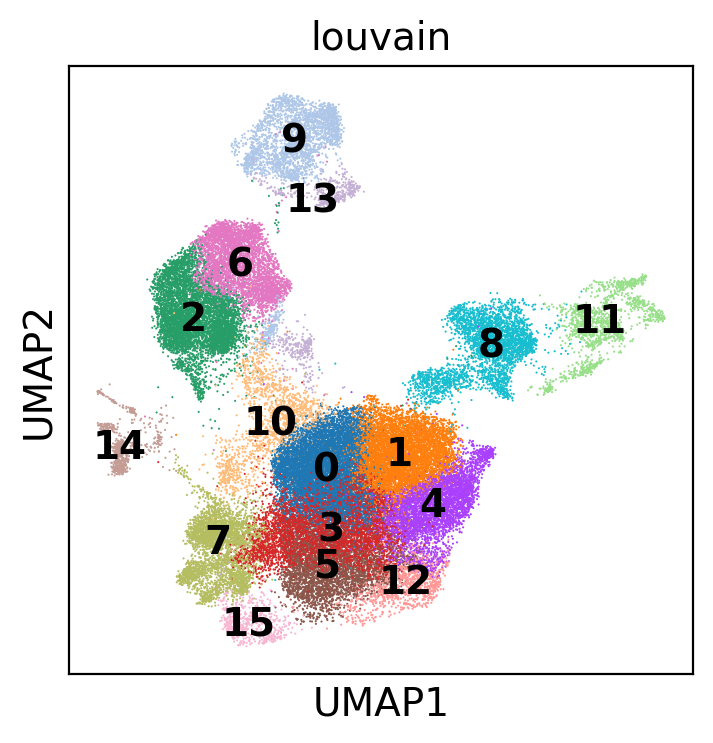

In [45]:
#color by marker
sc.pl.umap(adata, color=["louvain"],  legend_loc ="on data")

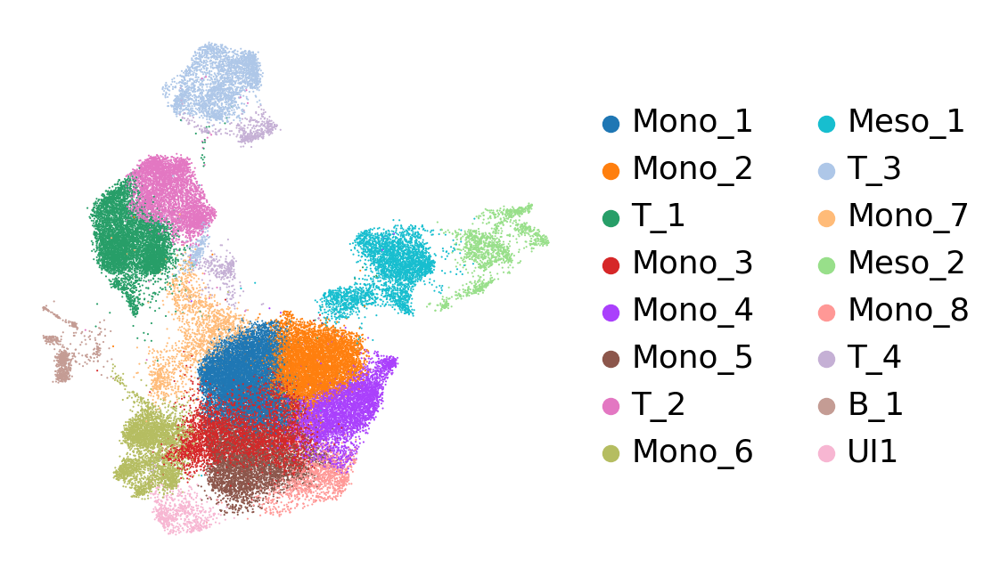

In [46]:
#Categories to rename
adata.obs['louvain'].cat.categories
adata.rename_categories('louvain', ['Mono_1', 'Mono_2', 'T_1', 'Mono_3', 'Mono_4','Mono_5', 
                                    'T_2','Mono_6', 'Meso_1', 'T_3', 'Mono_7',
                                    'Meso_2', "Mono_8","T_4",'B_1', 'UI1' ])
adata.obs['louvain'].value_counts()

sc.pl.umap(adata, color='louvain', title='', frameon=False)

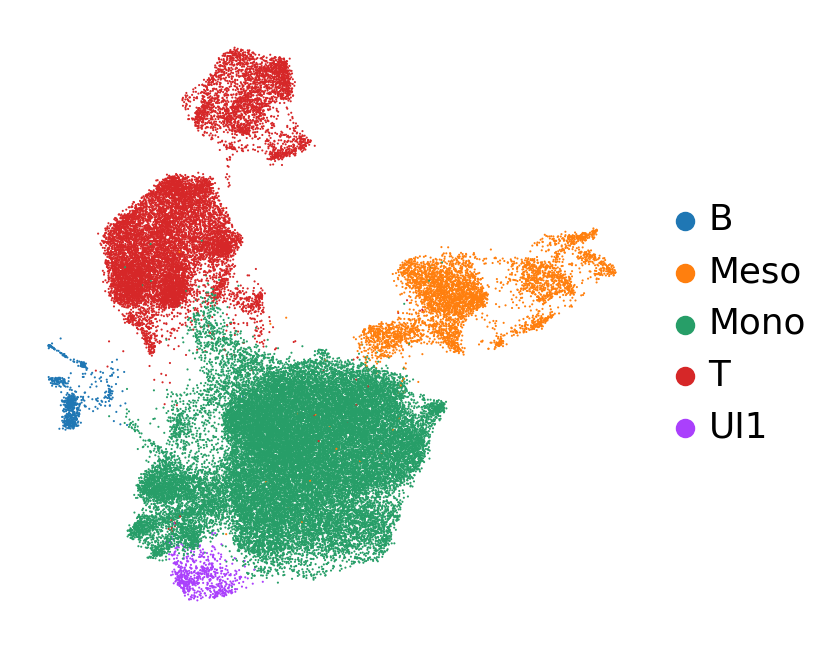

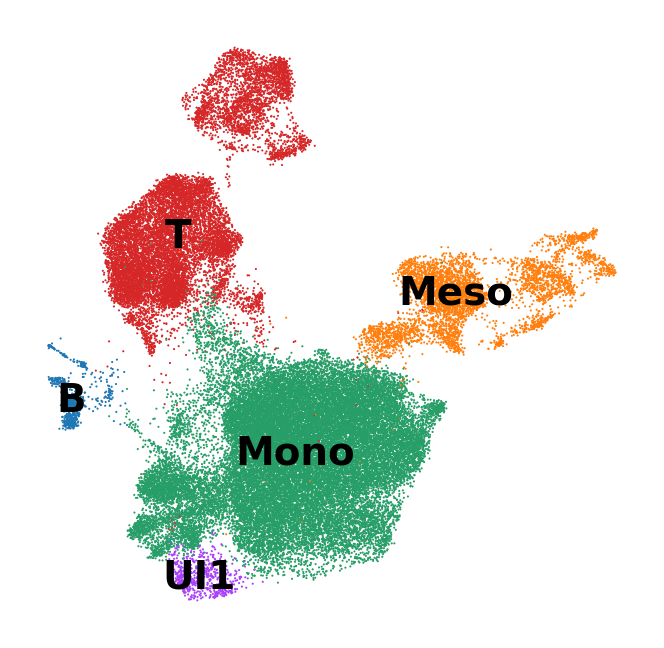

In [48]:
old_to_new = dict(Mono_1="Mono", Mono_2="Mono", T_1="T", Mono_3="Mono", Mono_4="Mono", Mono_5="Mono", 
                  T_2="T",Mono_6="Mono", Meso_1="Meso", T_3="T", Mono_7="Mono", Meso_2="Meso",Mono_8="Mono", B_1="B",
                  T_4='T', UI1 = "UI1")
adata.obs['new_clusters'] = (adata.obs['louvain'].map(old_to_new).astype('category'))
sc.pl.umap(adata, color='new_clusters', title='', frameon=False)
sc.pl.umap(adata, color='new_clusters', title='',  legend_loc='on data', frameon=False)

In [49]:
print("#Cells: ",adata.shape[0])
print("#T-Cells: ",adata[adata.obs["new_clusters"]=="T"].shape[0], 
      "(",adata[adata.obs["new_clusters"]=="T"].shape[0]/adata.shape[0]*100,"%)")
print("#Mesothelial-Cells: ",adata[adata.obs["new_clusters"]=="Meso"].shape[0],
      " (",adata[adata.obs["new_clusters"]=="Meso"].shape[0]/adata.shape[0]*100,"%)")
print("#B-Cells: ",adata[adata.obs["new_clusters"]=="B"].shape[0], 
      " (",adata[adata.obs["new_clusters"]=="B"].shape[0]/adata.shape[0]*100,"%)")
print("#Myofibroblast-Cells: ",adata[adata.obs["new_clusters"]=="Myo"].shape[0],
      " (",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/adata.shape[0]*100,"%)")
print("#Endothelial-Cells: ",adata[adata.obs["new_clusters"]=="Endo"].shape[0],
      " (",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/adata.shape[0]*100,"%)")
print("#Mononuclear-Cells: ",adata[adata.obs["new_clusters"]=="Mono"].shape[0],
      " (",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/adata.shape[0]*100,"%)")
print("#Fibrobalst-Cells: ",adata[adata.obs["new_clusters"]=="Fibro"].shape[0], 
      " (",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/adata.shape[0]*100,"%)")

#Cells:  51887
#T-Cells:  13253 ( 25.542043286372305 %)
#Mesothelial-Cells:  4682  ( 9.023454815271648 %)
#B-Cells:  708  ( 1.3645036328945594 %)
#Myofibroblast-Cells:  0  ( 0.0 %)
#Endothelial-Cells:  0  ( 0.0 %)
#Mononuclear-Cells:  32607  ( 62.84233044886002 %)
#Fibrobalst-Cells:  0  ( 0.0 %)


In [50]:
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#Cells: ",adata.shape[0]/nr_batch)
print("#T-Cells: ",adata[adata.obs["new_clusters"]=="T"].shape[0]/nr_batch,
      "(",(adata[adata.obs["new_clusters"]=="T"].shape[0])/(adata.shape[0])*100,"%)")
print("#Mesothelial-Cells: ",adata[adata.obs["new_clusters"]=="Meso"].shape[0]/nr_batch,
      " (",(adata[adata.obs["new_clusters"]=="Meso"].shape[0])/(adata.shape[0])*100,"%)")
print("#B-Cells: ",adata[adata.obs["new_clusters"]=="B"].shape[0]/nr_batch, 
      " (",(adata[adata.obs["new_clusters"]=="B"].shape[0])/(adata.shape[0])*100,"%)")
print("#Myofibroblast-Cells: ",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/(adata.shape[0])*100,"%)")
print("#Endothelial-Cells: ",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/nr_batch, 
      " (",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/(adata.shape[0])*100,"%)")
print("#Mononuclear-Cells: ",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/(adata.shape[0])*100,"%)")
print("#Fibrobalst-Cells: ",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/(adata.shape[0])*100,"%)")

normalized for number of samples:
#Cells:  8647.833333333334
#T-Cells:  2208.8333333333335 ( 25.542043286372305 %)
#Mesothelial-Cells:  780.3333333333334  ( 9.023454815271648 %)
#B-Cells:  118.0  ( 1.3645036328945594 %)
#Myofibroblast-Cells:  0.0  ( 0.0 %)
#Endothelial-Cells:  0.0  ( 0.0 %)
#Mononuclear-Cells:  5434.5  ( 62.84233044886002 %)
#Fibrobalst-Cells:  0.0  ( 0.0 %)


## subclustering T-cell:

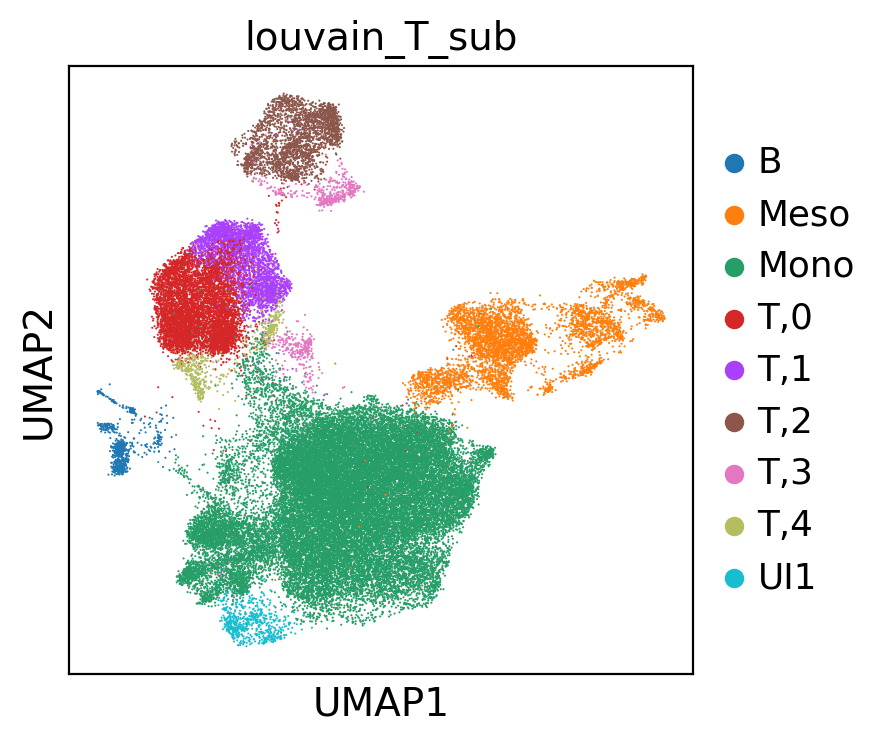

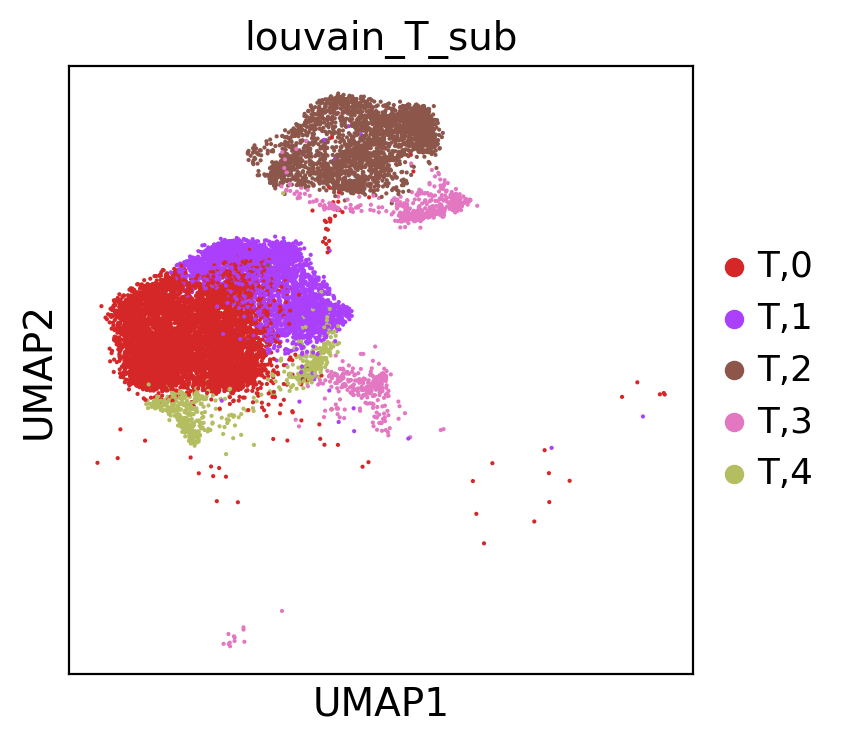

In [51]:
sc.tl.louvain(adata, restrict_to=('new_clusters', ['T']), resolution=0.3,
              key_added='louvain_T_sub')
if 'louvain_T_sub_colors' in adata.uns:
    del adata.uns['louvain_T_sub_colors']

sc.pl.umap(adata, color='louvain_T_sub')

sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

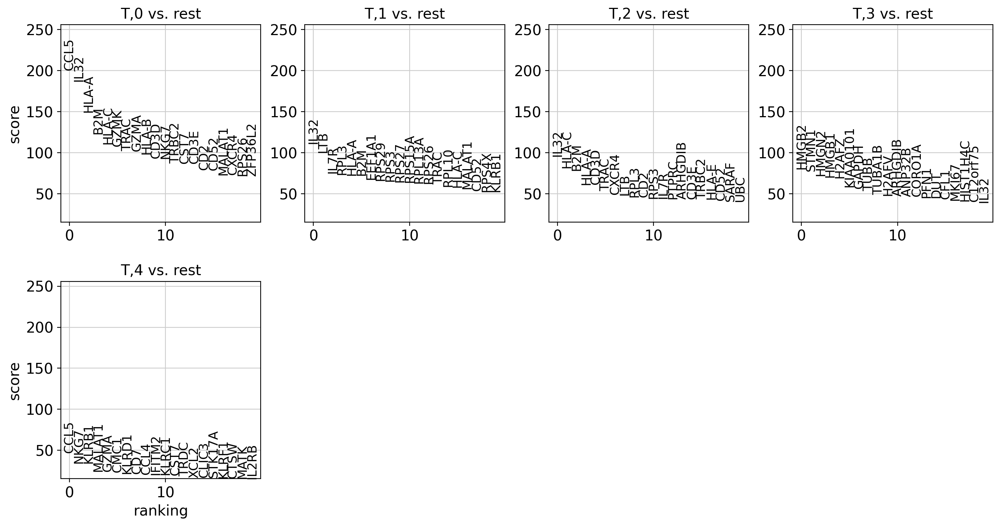

In [52]:
sc.tl.rank_genes_groups(adata, groupby='louvain_T_sub', key_added='rank_genes_T_sub')
T_clusters = [i for i in np.unique(adata.obs["louvain_T_sub"]) if "T" in i] 
sc.pl.rank_genes_groups(adata, key='rank_genes_T_sub', groups=T_clusters, fontsize=12)

**test if subclusters are based on real differences or only noise**:  
plot rank_genes 90-100

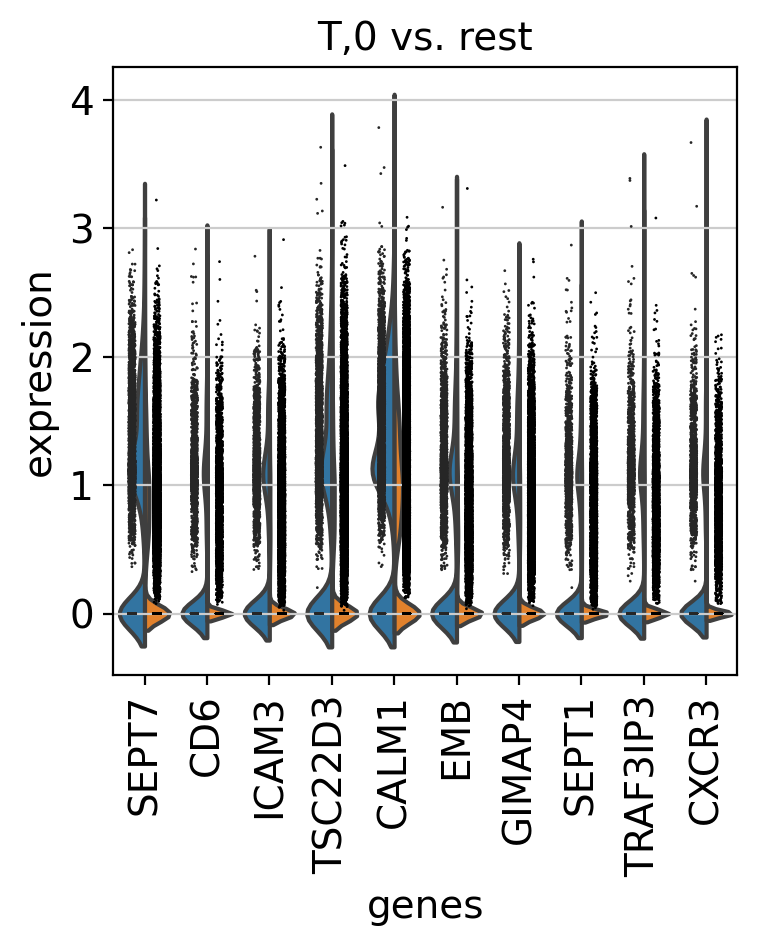

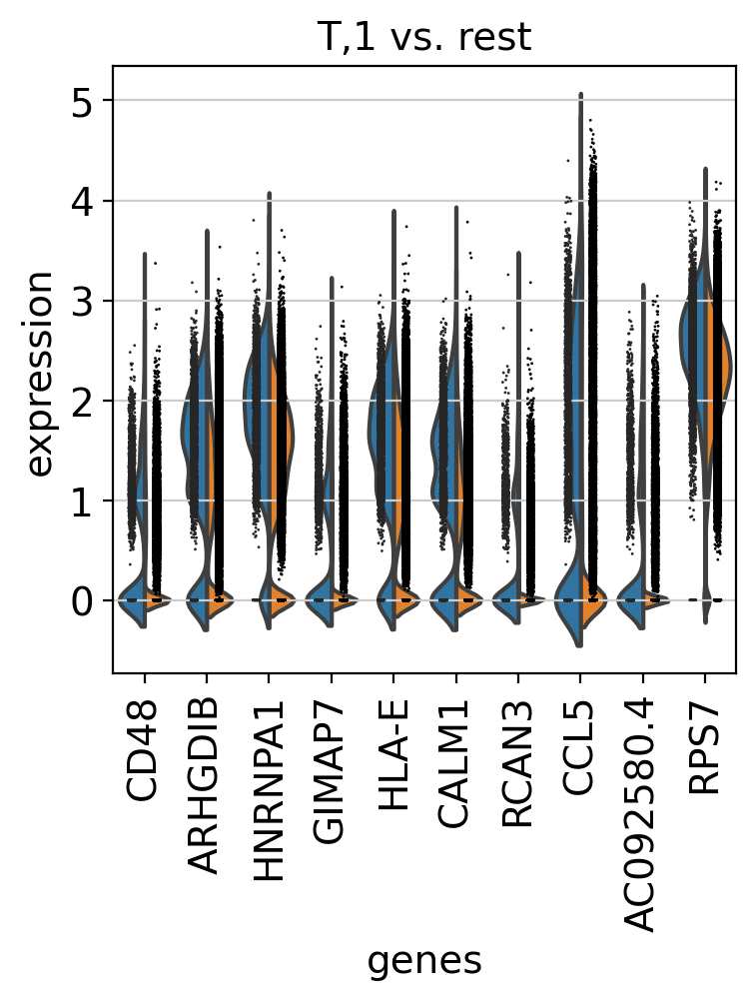

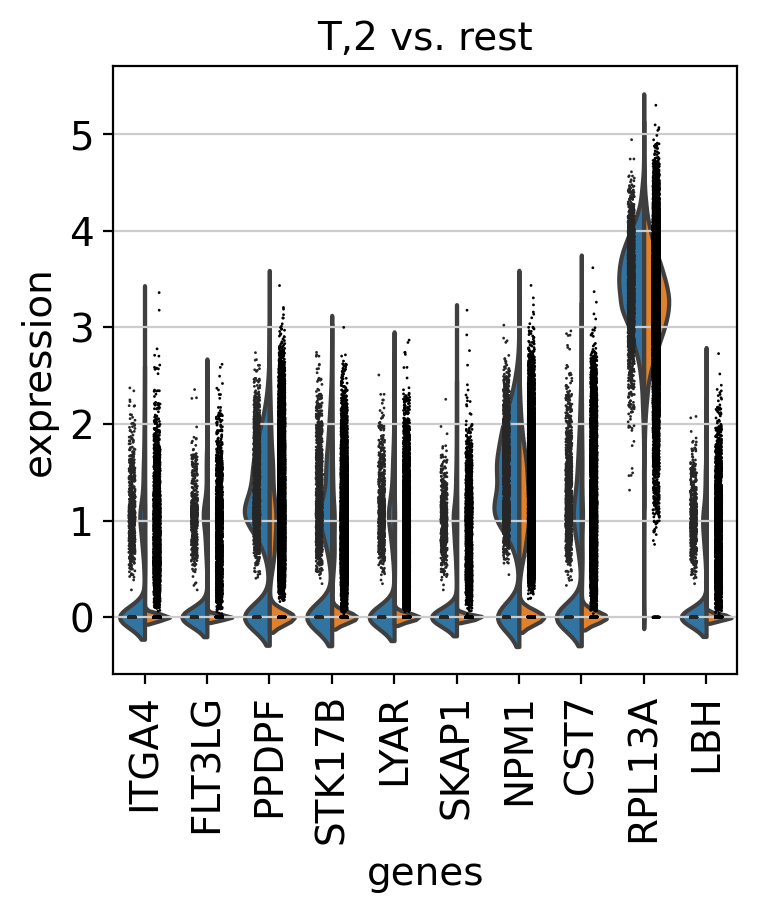

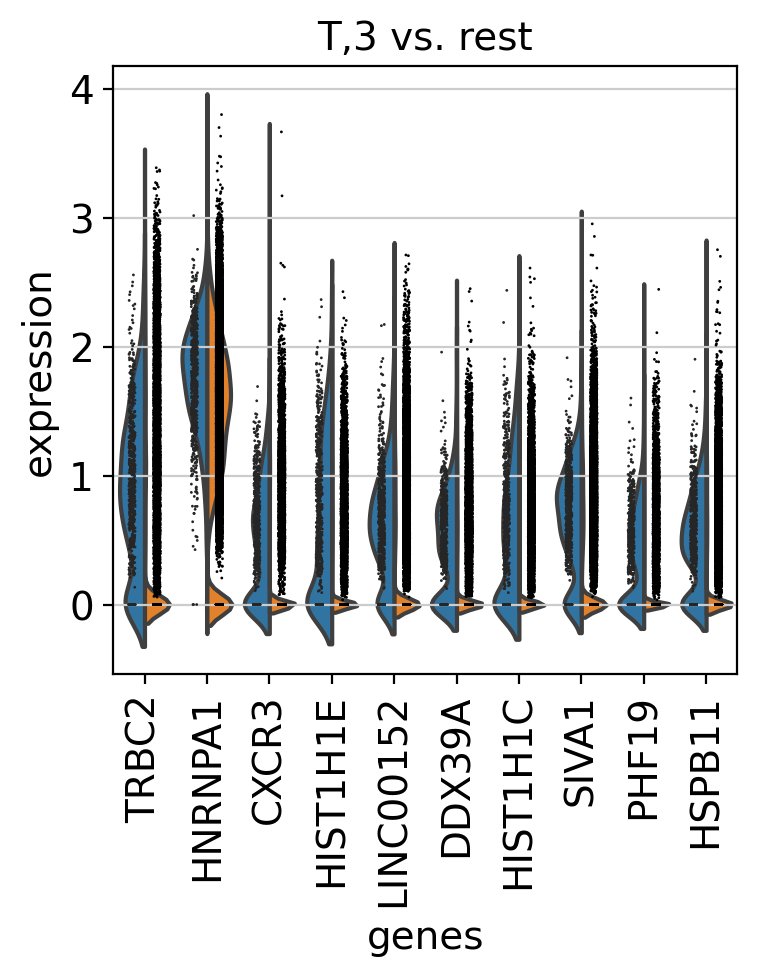

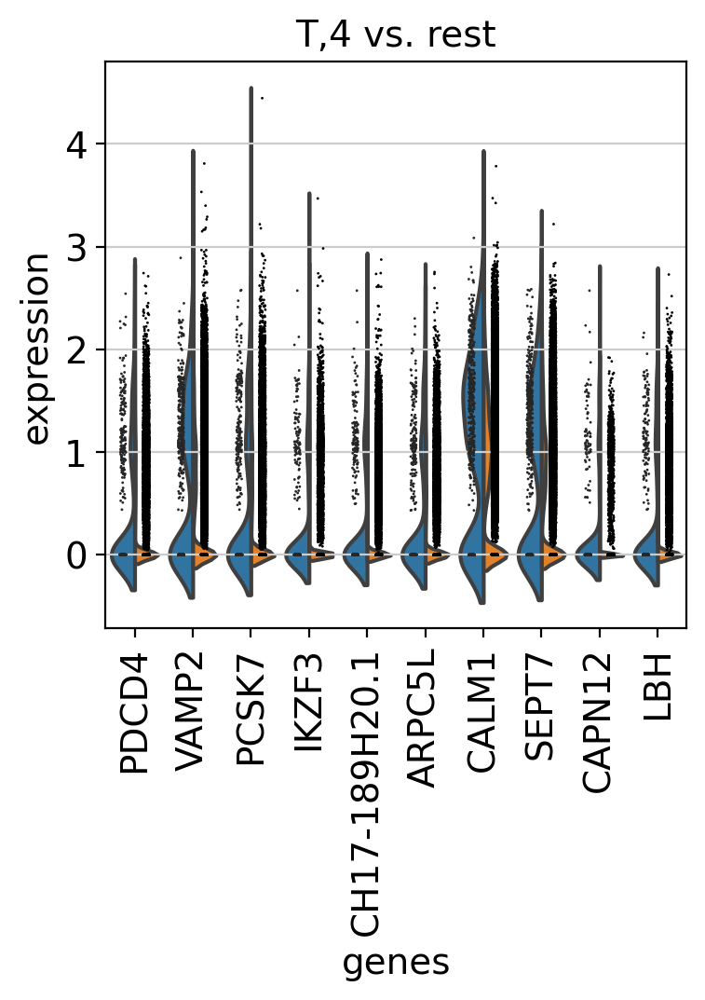

In [53]:
T_clusts = [clust for clust in adata.obs['louvain_T_sub'].cat.categories if clust.startswith('T')]

for clust in T_clusts:
    sc.pl.rank_genes_groups_violin(adata, use_raw=True, key='rank_genes_T_sub', 
                                   groups=[clust], 
                                   gene_names=adata.uns['rank_genes_T_sub']['names'][clust][90:100])

In [54]:
marker_genes_T = {"T-cells":["CD3D","CD3E","NKG7","IL23R","NFAT5",
                             "SGK1","HIF1A","IFNG","IL6","IL10", "CD4","TBX21","GATA3","RORC","FOXP3"]} 

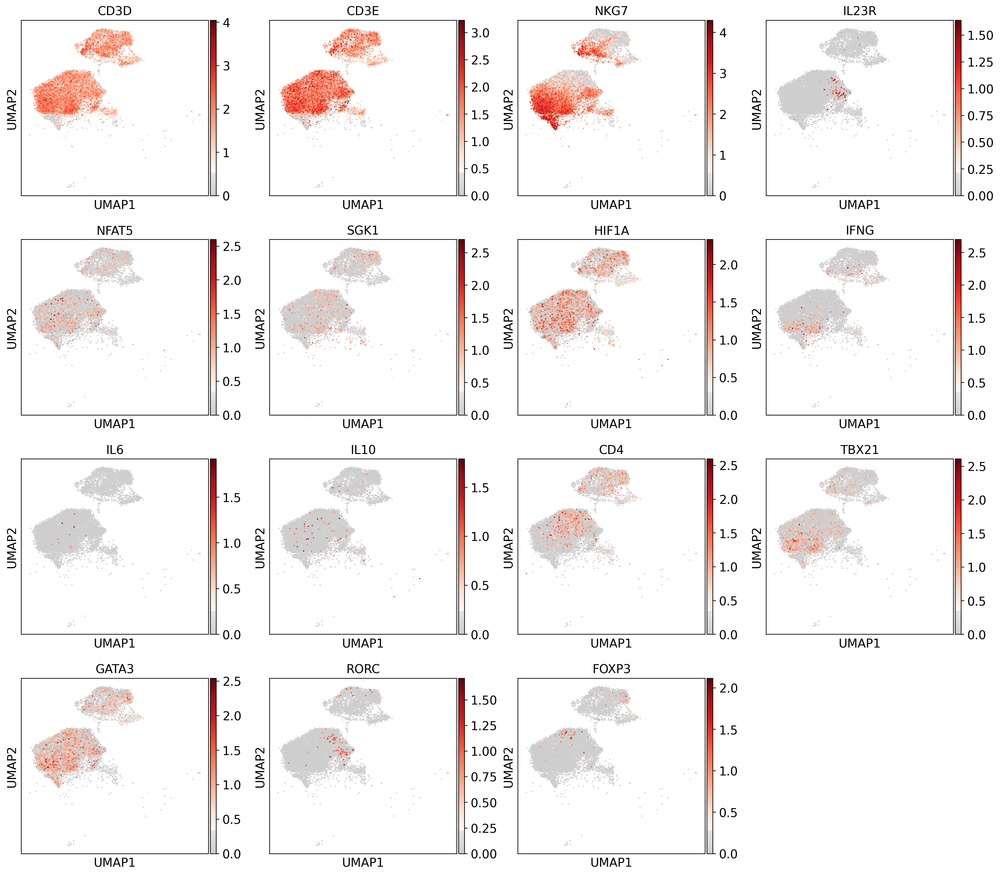

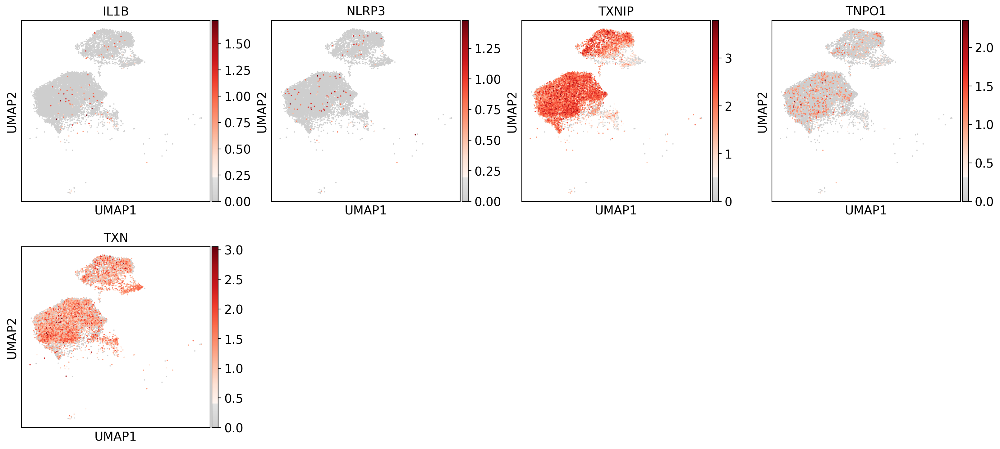

In [55]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color=marker_genes_T["T-cells"],
           title=marker_genes_T["T-cells"], color_map=mymap)

sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color=["IL1B","NLRP3","TXNIP", "TNPO1","TXN"],#TRN "TRDX","TRX", "TRX1"
           title=["IL1B","NLRP3","TXNIP","TNPO1","TXN",], color_map=mymap)#"TRDX", "TRX", "TRX1"

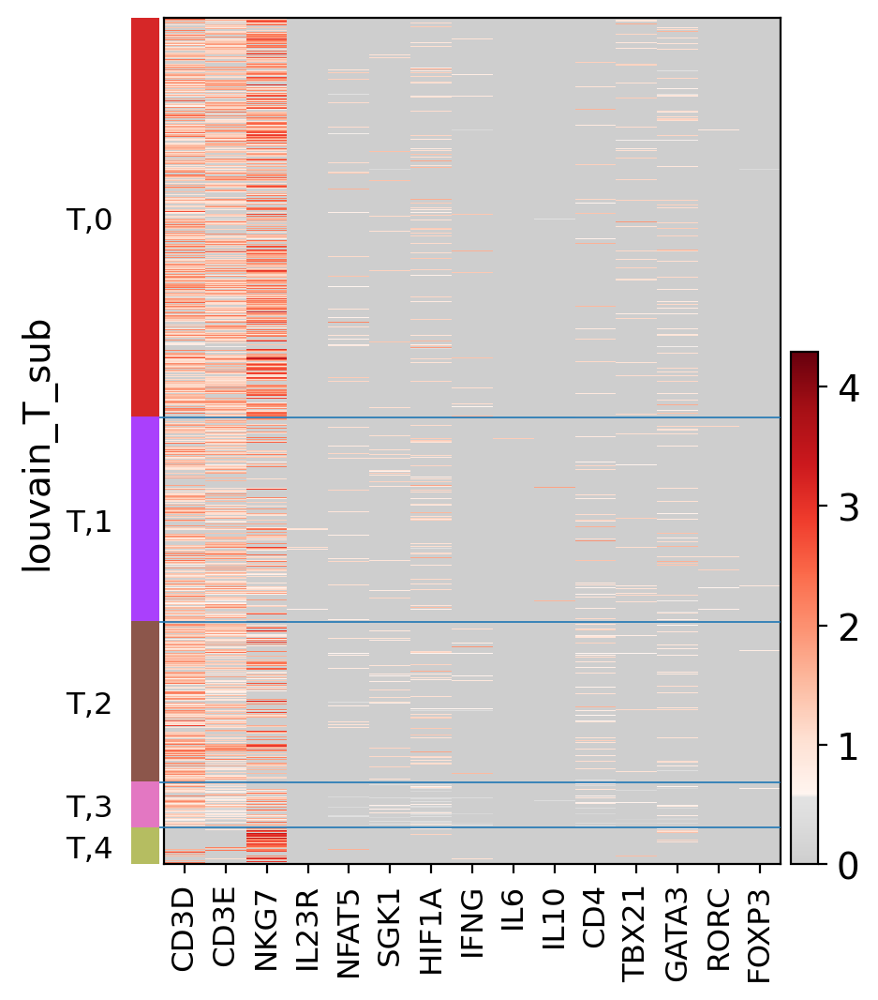

In [56]:
ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="T"], marker_genes_T["T-cells"], groupby="louvain_T_sub", 
                   show_gene_labels=True, cmap=mymap)     

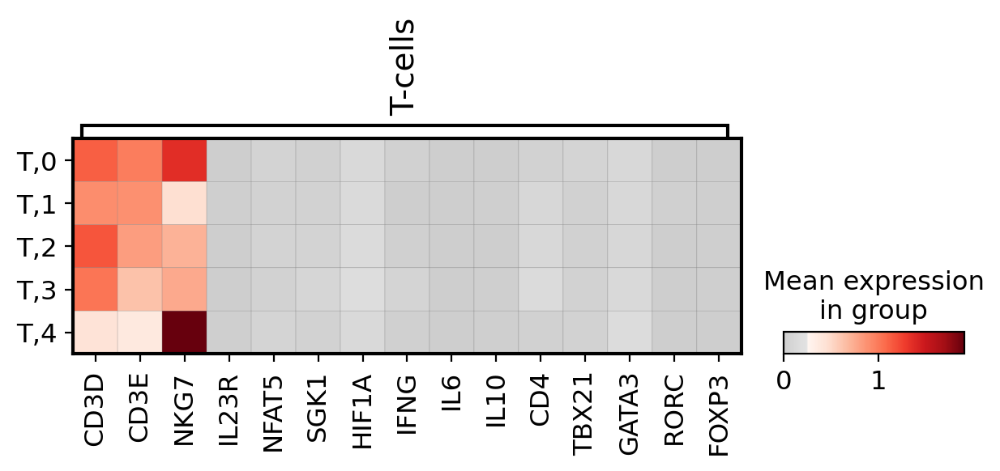

In [57]:
#Matrixplot
sc.pl.matrixplot(adata[adata.obs["new_clusters"]=="T"], marker_genes_T, groupby='louvain_T_sub', cmap=mymap)

In [58]:
import matplotlib.pyplot as plt
print("#T-Cells: ", len(adata[adata.obs["new_clusters"]=="T"]))
for m in marker_genes_T["T-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X > 0)
    print("#",m, " expressing cells: ",number, " (",round(number/len(adata[adata.obs["new_clusters"]=="T"])*100, 2),"%)", sep='')

#T-Cells:  13253
#CD3D expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#CD3E expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#NKG7 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#IL23R expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#NFAT5 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#SGK1 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#HIF1A expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#IFNG expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#IL6 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#IL10 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#CD4 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#TBX21 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#GATA3 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#RORC expressing cells:   (0, 0)	True (  (0, 0)	0.01%)
#FOXP3 expressing cells:   (0, 0)	True (  (0, 0)	0.01%)


In [59]:
import matplotlib.pyplot as plt
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#T-Cells: ", len(adata[adata.obs["new_clusters"]=="T"])/nr_batch)
for m in marker_genes_T["T-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X > 0)/nr_batch
    print("#",m, " expressing cells: ",number,
          " (",round(number/(len(adata[adata.obs["new_clusters"]=="T"])/nr_batch)*100, 2),"%)", sep='')

normalized for number of samples:
#T-Cells:  2208.8333333333335
#CD3D expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#CD3E expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#NKG7 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#IL23R expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#NFAT5 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#SGK1 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#HIF1A expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#IFNG expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#IL6 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#IL10 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#CD4 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#TBX21 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#GATA3 expressing cells:   (0, 0)	0.16666666666666666 (  (0, 0)	0.01%)
#RORC expressing cells:

In [ ]:
import matplotlib.pyplot as plt
for m in ["NFAT5","SGK1","HIF1A"]:
    print(m)
    l = list(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X) 
    l = list(filter(lambda num: num != 0, l))
    arr = np.array(l).flatten()
    print(l)
    print("Mean: ",np.mean(arr, axis=0))
    print("Std: ",np.std(arr, axis=0))

In [ ]:
print("#T-Cells: ", np.unique(adata[adata.obs["new_clusters"]=="T"].obs["batch"], return_counts=True))
for b in np.unique(adata.obs["batch"]):
    print(b)
    for m in marker_genes_T["T-cells"]:
        number = sum(adata[(adata.obs["new_clusters"]=="T") & (adata.obs["batch"]==b)].raw[: , m].X > 0)
        print("#",m, " expressing cells: ",number,
              " (",round(number/(len(adata[(adata.obs["new_clusters"]=="T") & (adata.obs["batch"]==b)]))*100, 2),"%)", sep='')

-> no RORC+ or CD4+ Cluster.. therefore I don't think a deeper subclustering or analysis is ppossible. Expecially since only 104 Cells express RORC. 

### CD4 positive Cells Subclustering

In [ ]:
adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)]

In [ ]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)],
                 color="CD4", color_map=mymap)
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)],
           color='louvain_T_sub', color_map=mymap)

In [ ]:
marker_genes_T4 = ["CD4","TBX21","FOXP3","GATA3","RORC"] #"CD3D","CD3E","NKG7",
ax = sc.pl.heatmap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
                   marker_genes_T4, groupby="louvain_T_sub", show_gene_labels=True, figsize =(6,10),
                   cmap=mymap)     

In [ ]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
           color=marker_genes_T4,  color_map=mymap)

### RORC postivie Cells

In [ ]:
adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)]

In [ ]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)], 
                 color="CD4", color_map=mymap)

In [ ]:
marker_genes_TR = ["RORC","IL17RA","NFAT5","SGK1",'SLC6A9','SLC6A17', 'SLC6A11', 'SLC6A6', 'SLC6A20',
                   'SLC6A3', 'SLC6A7', 'SLC6A8', 'SLC6A12', 'SLC6A13', 'SLC6A4', 'SLC6A16',"HIF1A",]
ax = sc.pl.heatmap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)], 
                   marker_genes_TR, groupby="louvain", show_gene_labels=True,# figsize =(8,12), 
                  cmap=mymap)     

In [ ]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)],
           color=marker_genes_TR, color_map=mymap)

## Mesothelial Cells

In [ ]:
sc.tl.louvain(adata, restrict_to=('new_clusters', ['Meso']), resolution=0.3,
              key_added='louvain_Meso_sub')

In [ ]:
#Show the new clustering:
if 'louvain_Meso_sub_colors' in adata.uns:
    del adata.uns['louvain_Meso_sub_colors']

sc.pl.umap(adata, color='louvain_Meso_sub')
sc.pl.umap(adata[adata.obs["new_clusters"]=="Meso"], color='louvain_Meso_sub')

In [ ]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_Meso_sub', key_added='rank_genes_Meso_sub')

In [ ]:
#Plot the new marker genes
Meso_clusters = [i for i in np.unique(adata.obs["louvain_Meso_sub"]) if "Meso" in i] 
sc.pl.rank_genes_groups(adata, key='rank_genes_Meso_sub', groups=Meso, fontsize=12)

**test if subclusters are based on real differences or only noise**:  
plot rank_genes 90-100

In [ ]:
Meso_clusts = [clust for clust in adata.obs['louvain_Meso_sub'].cat.categories if clust.startswith('Meso')]

for clust in Meso_clusts:
    sc.pl.rank_genes_groups_violin(adata, use_raw=True, key='rank_genes_Meso_sub', 
                                   groups=[clust], 
                                   gene_names=adata.uns['rank_genes_Meso_sub']['names'][clust][90:100])

In [ ]:
marker_genes_Meso = {"Meso-cells":["KRT5","UPK3B","PDPN","CX3CR1", "CX3CL1", "CCL2","IL6" ]} 

In [ ]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="Meso"], color=marker_genes_Meso["Meso-cells"],
           title=marker_genes_Meso["Meso-cells"], color_map=mymap)

In [ ]:
ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="Meso"], marker_genes_Meso["Meso-cells"],
                   groupby="louvain_Meso_sub", show_gene_labels=True, figsize =(8,12), cmap=mymap)     

In [ ]:
#Matrixplot
sc.pl.matrixplot(adata[adata.obs["new_clusters"]=="Meso"], marker_genes_Meso,
                 groupby='louvain_Meso_sub', cmap=mymap)

In [ ]:
import matplotlib.pyplot as plt
print("#Meso-Cells: ", len(adata[adata.obs["new_clusters"]=="Meso"]))
for m in marker_genes_Meso["Meso-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="Meso"].raw[: , m].X > 0)
    print("#",m, " expressing cells: ",number,
          " (",round(number/len(adata[adata.obs["new_clusters"]=="Meso"])*100, 2),"%)", sep='')

In [ ]:
import matplotlib.pyplot as plt
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#Meso-Cells: ", len(adata[adata.obs["new_clusters"]=="Meso"])/nr_batch)
for m in marker_genes_Meso["Meso-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="Meso"].raw[: , m].X > 0)/nr_batch
    print("#",m, " expressing cells: ",number,
          " (",round(number/(len(adata[adata.obs["new_clusters"]=="Meso"])/nr_batch)*100, 2),"%)", sep='')

In [ ]:
print("#Meso-Cells: ", np.unique(adata[adata.obs["new_clusters"]=="Meso"].obs["batch"], return_counts=True))
for b in np.unique(adata.obs["batch"]):
    print(b)
    for m in marker_genes_Meso["Meso-cells"]:
        number = sum(adata[(adata.obs["new_clusters"]=="Meso") & (adata.obs["batch"]==b)].raw[: , m].X > 0)
        print("#",m, " expressing cells: ",number,
              " (",round(number/(len(adata[(adata.obs["new_clusters"]=="Meso") & (adata.obs["batch"]==b)]))*100, 2),"%)", sep='')

In [ ]:
#adata.write(results_file)

In [ ]:
%%bash
jupyter nbconvert --to  html_toc CelltypIdentification_shortPD.ipynb --ExtractOutputPreprocessor.enabled=False